In [1]:
import torch
import torchvision

from torch import nn
from torchvision import datasets, transforms



In [2]:
try:
    import torch
    import torchvision
    assert int(torch.__version__.split(".")[1]) >= 12, "torch version should be 1.12+"
    assert int(torchvision.__version__.split(".")[1]) >= 13, "torchvision version should be 0.13+"
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")
except:
    print(f"[INFO] torch/torchvision versions not as required, installing nightly versions.")
    !pip3 install -U torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113
    import torch
    import torchvision
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")

[INFO] torch/torchvision versions not as required, installing nightly versions.
Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu113
torch version: 2.0.1+cu118
torchvision version: 0.15.2+cu118


In [3]:
# Continue with regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine

[INFO] Couldn't find torchinfo... installing it.
[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 3849, done.
remote: Counting objects: 100% (3849/3849), done.
remote: Compressing objects: 100% (1571/1571), done.
remote: Total 3849 (delta 2255), reused 3754 (delta 2217), pack-reused 0
Receiving objects: 100% (3849/3849), 647.06 MiB | 17.66 MiB/s, done.
Resolving deltas: 100% (2255/2255), done.
Updating files: 100% (248/248), done.


In [4]:
device= "cuda" if torch.cuda.is_available() else "cpu"

In [5]:
def set_seeds(seed:int=42):
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)

In [6]:
#get data
import os
import zipfile

from pathlib import Path

import requests

def download_data(source:str,destination:str,remove_source:bool =True) ->Path:
  data_path=Path("data/")
  image_path=data_path / destination

  if image_path.is_dir():
    print(f"{image_path} already exists! ")

  else:
    print(f"did not find {image_path}")
    image_path.mkdir(parents=True,exist_ok=True)
    target_file=Path(source).name
    with open(data_path /target_file,"wb") as f:
      request=requests.get(source)
      print(f"downloading {target_file} from {source} ...")
      f.write(request.content)

    with zipfile.ZipFile(data_path /target_file, "r" ) as zip_ref:
      print(f"unzipping{target_file} data")
      zip_ref.extractall(image_path)

    if remove_source:
      os.remove(data_path /target_file)

  return image_path





In [7]:
image_path= download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                          destination="pizza_steak_sushi")
image_path

did not find data/pizza_steak_sushi
downloading pizza_steak_sushi.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip ...
unzippingpizza_steak_sushi.zip data


PosixPath('data/pizza_steak_sushi')

In [8]:
#get datasets and dataloaders with manual transforms
train_dir=image_path /"train"
test_dir= image_path /"test"
train_dir,test_dir

(PosixPath('data/pizza_steak_sushi/train'),
 PosixPath('data/pizza_steak_sushi/test'))

In [9]:
#setup imageNet normalizations levels
normalize=transforms.Normalize(mean=[0.485,0.456,0.406],
                               std=[0.229,0.224,0.225])

manual_transforms=transforms.Compose([transforms.Resize((224,224)),
                                      transforms.ToTensor(),
                                      normalize])

print(f"manually created transforms:{manual_transforms}")

from going_modular.going_modular import data_setup
train_dataloader, test_dataloader,class_names=data_setup.create_dataloaders(train_dir=train_dir,
                                                                            test_dir=test_dir,
                                                                            transform=manual_transforms,
                                                                            batch_size=32)

manually created transforms:Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


In [10]:
train_dataloader, test_dataloader,class_names

(<torch.utils.data.dataloader.DataLoader at 0x7f4ad47658a0>,
 ['pizza', 'steak', 'sushi'])

In [11]:
# dataloaders with auto transforms
train_dir=image_path / "train"
test_dir=image_path / "test"

weights= torchvision.models.EfficientNet_B0_Weights.DEFAULT
automatic_transforms=weights.transforms()
print(f"automatic transforms{automatic_transforms}")
train_dataloader,test_dataloader,class_names=data_setup.create_dataloaders(train_dir=train_dir,
                                                                           test_dir=test_dir,
                                                                           transform=automatic_transforms,
                                                                           batch_size=32)
train_dataloader,test_dataloader,class_names

automatic transformsImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)


(<torch.utils.data.dataloader.DataLoader at 0x7f4a04cff7c0>,
 ['pizza', 'steak', 'sushi'])

In [12]:
#get pretrained model
#model=torchvision.models.efficientnet_b0(pretrained=True).to(device)
weights= torchvision.models.EfficientNet_B0_Weights.DEFAULT
model=torchvision.models.efficientnet_b0(weights=weights).to(device)
model

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 85.8MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [13]:
#freeze base layers
for param in model.features.parameters():
  param.requires_grad=False



In [14]:
# adjust out features
set_seeds()
model.classifier= nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(in_features=1280, out_features=len(class_names))
).to(device)

In [15]:
from torchinfo import summary
summary(model,
        input_size=(32,3,224,224),
        verbose=0,
        col_names=["input_size","output_size","num_params","trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [16]:
#train a single model and track results
loss_fn=nn.CrossEntropyLoss()
optimizer=torch.optim.Adam(model.parameters(), lr=0.001)


In [17]:
#setup a summary writer
from torch.utils.tensorboard import SummaryWriter
writer=SummaryWriter()
writer

In [18]:
from tqdm.auto import tqdm
from typing import Dict,List,Tuple
from going_modular.going_modular.engine import train_step, test_step


def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:

    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

        ##experiment tracking
        writer.add_scalars(main_tag="Loss",
                           tag_scalar_dict={"train_loss":train_loss,
                                            "test_loss":test_loss},
                           global_step=epoch)

        writer.add_scalars(main_tag="Accuracy",
                           tag_scalar_dict={"train_acc":train_acc,
                                            "test_acc":test_acc},
                           global_step=epoch)
        writer.add_graph(model=model,
                         input_to_model=torch.randn(32,3,224,224).to(device))

    writer.close()

    # Return the filled results at the end of the epochs
    return results


In [19]:
set_seeds()
results=train(model=model,
              train_dataloader=train_dataloader,
              test_dataloader=test_dataloader,
              optimizer=optimizer,
              loss_fn=loss_fn,
              epochs=5,
              device=device)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0929 | train_acc: 0.4023 | test_loss: 0.9125 | test_acc: 0.5502
Epoch: 2 | train_loss: 0.8966 | train_acc: 0.6562 | test_loss: 0.7839 | test_acc: 0.8561
Epoch: 3 | train_loss: 0.8045 | train_acc: 0.7422 | test_loss: 0.6716 | test_acc: 0.8864
Epoch: 4 | train_loss: 0.6787 | train_acc: 0.7305 | test_loss: 0.6697 | test_acc: 0.8258
Epoch: 5 | train_loss: 0.7066 | train_acc: 0.7188 | test_loss: 0.6737 | test_acc: 0.7737


In [20]:
from torch.utils import tensorboard
# view our experiments
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [21]:
#create a function to prepare a summary writer instance
from torch.utils.tensorboard import SummaryWriter

def create_writer(experiment_name:str,
                  model_name:str,
                  extra:str=None):
  from datetime import datetime
  import os

  timestamp=datetime.now().strftime("%Y-%m-%d")

  if extra:
    log_dir=os.path.join("runs",timestamp, experiment_name,model_name,extra)

  else:
    log_dir=os.path.join("runs",timestamp, experiment_name,model_name)


  print(f"created summary writer saving to {log_dir}")
  return SummaryWriter(log_dir=log_dir)

In [22]:
example_writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb0",
                               extra="5_epochs")
example_writer


created summary writer saving to runs/2023-07-15/data_10_percent/effnetb0/5_epochs


In [23]:
#update train with writer
from tqdm.auto import tqdm
from typing import Dict,List,Tuple
from going_modular.going_modular.engine import train_step, test_step


def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer:torch.utils.tensorboard.writer.SummaryWriter) -> Dict[str, List]:

    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

        if writer:

          ##experiment tracking
          writer.add_scalars(main_tag="Loss",tag_scalar_dict={"train_loss":train_loss,"test_loss":test_loss},global_step=epoch)

          writer.add_scalars(main_tag="Accuracy",tag_scalar_dict={"train_acc":train_acc,"test_acc":test_acc},global_step=epoch)
          writer.add_graph(model=model,input_to_model=torch.randn(32,3,224,224).to(device))

          writer.close()

        else:
          pass

    # Return the filled results at the end of the epochs
    return results

In [24]:
data10=download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                          destination="pizza_steak_sushi")

data/pizza_steak_sushi already exists! 


In [25]:
data10

PosixPath('data/pizza_steak_sushi')

In [26]:
data20=download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
                          destination="pizza_steak_sushi_20")

did not find data/pizza_steak_sushi_20
downloading pizza_steak_sushi_20_percent.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip ...
unzippingpizza_steak_sushi_20_percent.zip data


In [27]:
#transform datasets and create dataloaders
train_dir10=data10 / "train"
train_dir20= data20 / "train"

test_dir10=data10 / "test"



normalize=transforms.Normalize(mean=[0.485,0.456,0.406],
                               std=[0.229,0.224,0.225])
simple_transform= transforms.Compose([transforms.Resize((224,224)),
                                      transforms.ToTensor(),
                                      normalize])




In [28]:
batch_size=32
train_dataloader10,test_dataloader, class_names =data_setup.create_dataloaders(train_dir=train_dir10,
                                                                               test_dir=test_dir,
                                                                               transform=simple_transform,
                                                                               batch_size=batch_size)

train_dataloader20,test_dataloader, class_names =data_setup.create_dataloaders(train_dir=train_dir20,
                                                                               test_dir=test_dir,
                                                                               transform=simple_transform,
                                                                               batch_size=batch_size)
print(f"number of batches of size {batch_size} in 10% train data: {len(train_dataloader10)}")
print(f"number of batches of size {batch_size} in 20% train data: {len(train_dataloader20)}")
print(f"number of batches of size {batch_size} in 10% test data: {len(test_dataloader)}")
print(f"class names :{class_names}")

number of batches of size 32 in 10% train data: 8
number of batches of size 32 in 20% train data: 15
number of batches of size 32 in 10% test data: 3
class names :['pizza', 'steak', 'sushi']


In [29]:
#create feature extractor models
import torchvision

effnetb2_weights= torchvision.models.EfficientNet_B2_Weights.DEFAULT
effnetb2=torchvision.models.efficientnet_b2(weights=effnetb2_weights)
effnetb2

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-bcdf34b7.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-bcdf34b7.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 79.2MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [30]:
summary(model=effnetb2,
        input_size=(32,3,224,224),
        verbose=0,
        col_names=["input_size","output_size","num_params","trainable"],
        col_width=20,
        row_settings=["var_names"])


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

In [31]:
import torchvision
from torch import nn
out_features=len(class_names)

def create_effnetB0():
  weights=torchvision.models.EfficientNet_B0_Weights.DEFAULT
  model=torchvision.models.efficientnet_b0(weights=weights)

  #freeze
  for param in model.features.parameters():
    param.requires_grad=False

  #change the classifier head
  set_seeds()
  model.classifier=nn.Sequential(
      nn.Dropout(p=0.2,inplace=True),
      nn.Linear(in_features=1280,out_features=out_features)
  ).to(device)

  model.name="effnetb0"
  print(f"created new{model.name} model...")


  return model

In [32]:
created_model_test=create_effnetB0()

created neweffnetb0 model...


In [33]:
summary(model=created_model_test,
        input_size=(32,3,224,224),
        verbose=0,
        col_names=["input_size","output_size","num_params","trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [34]:
import torchvision
from torch import nn
out_features=len(class_names)

def create_effnetB2():
  weights=torchvision.models.EfficientNet_B2_Weights.DEFAULT
  model=torchvision.models.efficientnet_b2(weights=weights)

  #freeze
  for param in model.features.parameters():
    param.requires_grad=False

  #change the classifier head
  set_seeds()
  model.classifier=nn.Sequential(
      nn.Dropout(p=0.3,inplace=True),
      nn.Linear(in_features=1408,out_features=out_features)
  ).to(device)

  model.name="effnetb2"
  print(f"created new{model.name} model...")


  return model

In [35]:
created_model2_test=create_effnetB2()

created neweffnetb2 model...


In [36]:
summary(model=created_model2_test,
        input_size=(32,3,224,224),
        verbose=0,
        col_names=["input_size","output_size","num_params","trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [37]:
num_epochs= [5,10]
models=["effnetb0", "effnetb2"]
train_dataloaders= {"data10":train_dataloader10,
                    "data20":train_dataloader20}



In [40]:
%%time
from going_modular.going_modular.utils import save_model

set_seeds(seed=42)
experiment_number=0

for dataloader_name, train_dataloader in train_dataloaders.items():
  for epoch in num_epochs:
    for model_name in models:

      experiment_number +=1

      if model_name == "effnetb0" :
        model =create_effnetB0()

      else:
        model=create_effnetB2()

      loss_fn=nn.CrossEntropyLoss()
      optimizer=torch.optim.Adam(params=model.parameters(),lr=0.001)
      train(model=model,
            train_dataloader=train_dataloader,
            test_dataloader=test_dataloader,
            optimizer=optimizer,
            loss_fn=loss_fn,
            epochs=epoch,
            device=device,
            writer=create_writer(experiment_name=dataloader_name,
                                 model_name=model_name,
                                 extra=f"{epoch} _epochs"))
      save_filepath=f"07__{model_name}_{dataloader_name}_ {epoch} epochs.pth"
      save_model(model=model,
                 target_dir="models",
                 model_name=save_filepath)
      print("-"*50 +"\n")





created neweffnetb0 model...
created summary writer saving to runs/2023-07-15/data10/effnetb0/5 _epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0433 | train_acc: 0.4805 | test_loss: 0.9283 | test_acc: 0.4782
Epoch: 2 | train_loss: 0.9400 | train_acc: 0.5469 | test_loss: 0.8346 | test_acc: 0.5492
Epoch: 3 | train_loss: 0.8243 | train_acc: 0.6953 | test_loss: 0.7293 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7029 | train_acc: 0.7773 | test_loss: 0.6177 | test_acc: 0.8759
Epoch: 5 | train_loss: 0.6150 | train_acc: 0.8867 | test_loss: 0.5830 | test_acc: 0.8864
[INFO] Saving model to: models/07__effnetb0_data10_ 5 epochs.pth
--------------------------------------------------

created neweffnetb2 model...
created summary writer saving to runs/2023-07-15/data10/effnetb2/5 _epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0832 | train_acc: 0.3906 | test_loss: 0.9597 | test_acc: 0.7008
Epoch: 2 | train_loss: 0.8958 | train_acc: 0.6484 | test_loss: 0.9042 | test_acc: 0.6818
Epoch: 3 | train_loss: 0.8473 | train_acc: 0.6641 | test_loss: 0.8053 | test_acc: 0.8049
Epoch: 4 | train_loss: 0.7022 | train_acc: 0.8477 | test_loss: 0.6936 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7011 | train_acc: 0.7266 | test_loss: 0.6520 | test_acc: 0.8968
[INFO] Saving model to: models/07__effnetb2_data10_ 5 epochs.pth
--------------------------------------------------

created neweffnetb0 model...
created summary writer saving to runs/2023-07-15/data10/effnetb0/10 _epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0433 | train_acc: 0.4805 | test_loss: 0.9283 | test_acc: 0.4782
Epoch: 2 | train_loss: 0.9400 | train_acc: 0.5469 | test_loss: 0.8346 | test_acc: 0.5492
Epoch: 3 | train_loss: 0.8243 | train_acc: 0.6953 | test_loss: 0.7293 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7029 | train_acc: 0.7773 | test_loss: 0.6177 | test_acc: 0.8759
Epoch: 5 | train_loss: 0.6150 | train_acc: 0.8867 | test_loss: 0.5830 | test_acc: 0.8864
Epoch: 6 | train_loss: 0.5431 | train_acc: 0.8750 | test_loss: 0.5943 | test_acc: 0.8561
Epoch: 7 | train_loss: 0.6385 | train_acc: 0.7109 | test_loss: 0.5933 | test_acc: 0.8561
Epoch: 8 | train_loss: 0.5075 | train_acc: 0.8008 | test_loss: 0.5382 | test_acc: 0.8968
Epoch: 9 | train_loss: 0.4688 | train_acc: 0.9180 | test_loss: 0.5318 | test_acc: 0.8759
Epoch: 10 | train_loss: 0.5795 | train_acc: 0.7344 | test_loss: 0.4907 | test_acc: 0.8759
[INFO] Saving model to: models/07__effnetb0_data10_ 10 epochs.pth
-------------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0832 | train_acc: 0.3906 | test_loss: 0.9597 | test_acc: 0.7008
Epoch: 2 | train_loss: 0.8958 | train_acc: 0.6484 | test_loss: 0.9042 | test_acc: 0.6818
Epoch: 3 | train_loss: 0.8473 | train_acc: 0.6641 | test_loss: 0.8053 | test_acc: 0.8049
Epoch: 4 | train_loss: 0.7022 | train_acc: 0.8477 | test_loss: 0.6936 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7011 | train_acc: 0.7266 | test_loss: 0.6520 | test_acc: 0.8968
Epoch: 6 | train_loss: 0.5974 | train_acc: 0.8945 | test_loss: 0.6605 | test_acc: 0.8769
Epoch: 7 | train_loss: 0.6202 | train_acc: 0.8008 | test_loss: 0.6050 | test_acc: 0.9384
Epoch: 8 | train_loss: 0.5338 | train_acc: 0.8164 | test_loss: 0.6020 | test_acc: 0.8570
Epoch: 9 | train_loss: 0.4978 | train_acc: 0.9258 | test_loss: 0.5626 | test_acc: 0.8873
Epoch: 10 | train_loss: 0.5301 | train_acc: 0.8008 | test_loss: 0.5476 | test_acc: 0.8977
[INFO] Saving model to: models/07__effnetb2_data10_ 10 epochs.pth
-------------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9645 | train_acc: 0.5938 | test_loss: 0.6673 | test_acc: 0.8864
Epoch: 2 | train_loss: 0.6941 | train_acc: 0.7833 | test_loss: 0.5834 | test_acc: 0.9072
Epoch: 3 | train_loss: 0.5817 | train_acc: 0.8313 | test_loss: 0.5024 | test_acc: 0.9280
Epoch: 4 | train_loss: 0.4582 | train_acc: 0.8917 | test_loss: 0.4186 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.4519 | train_acc: 0.8604 | test_loss: 0.3827 | test_acc: 0.9280
[INFO] Saving model to: models/07__effnetb0_data20_ 5 epochs.pth
--------------------------------------------------

created neweffnetb2 model...
created summary writer saving to runs/2023-07-15/data20/effnetb2/5 _epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9886 | train_acc: 0.5250 | test_loss: 0.7831 | test_acc: 0.8153
Epoch: 2 | train_loss: 0.7137 | train_acc: 0.7875 | test_loss: 0.6514 | test_acc: 0.8864
Epoch: 3 | train_loss: 0.5769 | train_acc: 0.8854 | test_loss: 0.5538 | test_acc: 0.9384
Epoch: 4 | train_loss: 0.5234 | train_acc: 0.8604 | test_loss: 0.5132 | test_acc: 0.9176
Epoch: 5 | train_loss: 0.4641 | train_acc: 0.8688 | test_loss: 0.4458 | test_acc: 0.9384
[INFO] Saving model to: models/07__effnetb2_data20_ 5 epochs.pth
--------------------------------------------------

created neweffnetb0 model...
created summary writer saving to runs/2023-07-15/data20/effnetb0/10 _epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9645 | train_acc: 0.5938 | test_loss: 0.6673 | test_acc: 0.8864
Epoch: 2 | train_loss: 0.6941 | train_acc: 0.7833 | test_loss: 0.5834 | test_acc: 0.9072
Epoch: 3 | train_loss: 0.5817 | train_acc: 0.8313 | test_loss: 0.5024 | test_acc: 0.9280
Epoch: 4 | train_loss: 0.4582 | train_acc: 0.8917 | test_loss: 0.4186 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.4519 | train_acc: 0.8604 | test_loss: 0.3827 | test_acc: 0.9280
Epoch: 6 | train_loss: 0.4218 | train_acc: 0.8917 | test_loss: 0.3734 | test_acc: 0.9384
Epoch: 7 | train_loss: 0.4005 | train_acc: 0.8646 | test_loss: 0.3395 | test_acc: 0.9176
Epoch: 8 | train_loss: 0.3453 | train_acc: 0.8896 | test_loss: 0.3497 | test_acc: 0.9384
Epoch: 9 | train_loss: 0.3740 | train_acc: 0.8938 | test_loss: 0.3457 | test_acc: 0.9384
Epoch: 10 | train_loss: 0.3839 | train_acc: 0.8938 | test_loss: 0.2856 | test_acc: 0.9176
[INFO] Saving model to: models/07__effnetb0_data20_ 10 epochs.pth
-------------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9886 | train_acc: 0.5250 | test_loss: 0.7831 | test_acc: 0.8153
Epoch: 2 | train_loss: 0.7137 | train_acc: 0.7875 | test_loss: 0.6514 | test_acc: 0.8864
Epoch: 3 | train_loss: 0.5769 | train_acc: 0.8854 | test_loss: 0.5538 | test_acc: 0.9384
Epoch: 4 | train_loss: 0.5234 | train_acc: 0.8604 | test_loss: 0.5132 | test_acc: 0.9176
Epoch: 5 | train_loss: 0.4641 | train_acc: 0.8688 | test_loss: 0.4458 | test_acc: 0.9384
Epoch: 6 | train_loss: 0.3801 | train_acc: 0.9062 | test_loss: 0.4625 | test_acc: 0.8977
Epoch: 7 | train_loss: 0.3591 | train_acc: 0.9271 | test_loss: 0.4205 | test_acc: 0.9280
Epoch: 8 | train_loss: 0.3300 | train_acc: 0.9000 | test_loss: 0.4149 | test_acc: 0.9176
Epoch: 9 | train_loss: 0.3499 | train_acc: 0.8896 | test_loss: 0.4376 | test_acc: 0.8371
Epoch: 10 | train_loss: 0.3734 | train_acc: 0.8667 | test_loss: 0.3794 | test_acc: 0.9489
[INFO] Saving model to: models/07__effnetb2_data20_ 10 epochs.pth
-------------------------------------------

In [41]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1867), started 0:40:40 ago. (Use '!kill 1867' to kill it.)

<IPython.core.display.Javascript object>

In [42]:
#best model effnetb2/ epochs:10/ 20% data

In [48]:
# Upload the results to TensorBoard.dev (uncomment to try it out)
!tensorboard dev upload --logdir runs \
    --name "07. PyTorch Experiment Tracking: FoodVision Mini model results" \
    --description "Comparing results of different model size, training data amount and training time."

2023-07-15 15:33:02.942503: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT

***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

runs

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

To sign in with the TensorBoard uploader:

1. On your computer or phone, visit:

   https://www.google.com/device

2. Sign in with your Google account, then enter:

   QTD-SKS-RNJ


Upload started and will continue reading any new data as it's added to the logdir.

To sto

In [51]:
#load in the best model
# best model path: models/07__effnetb2_data20_ 10 epochs.pth
best_path="models/07__effnetb2_data20_ 10 epochs.pth"
best_model=create_effnetB2()
best_model.load_state_dict(torch.load(best_path))


created neweffnetb2 model...


<All keys matched successfully>

In [53]:
from pathlib import Path

#get the model size in bytes then convert it to MG
effnetB2_model_size=Path(best_path).stat().st_size // (1024*1024)
print(f"EfficientNetB2 feature extractor model size:{effnetB2_model_size} MB")

EfficientNetB2 feature extractor model size:29 MB


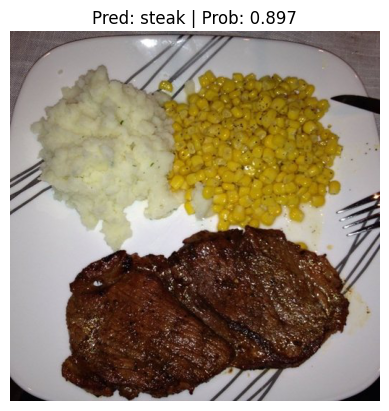

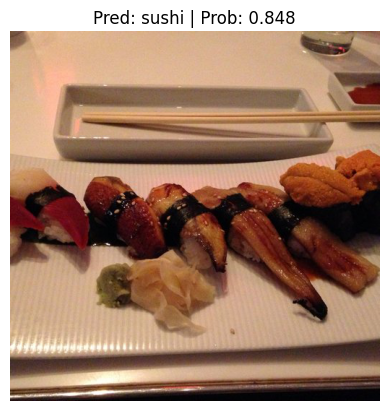

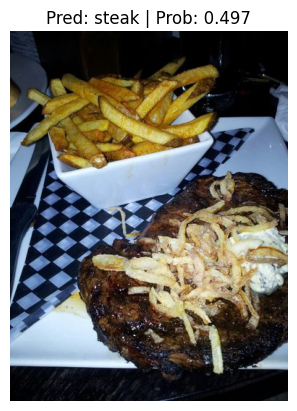

In [55]:
#import functions to make prediction on images and plot them
from going_modular.going_modular.predictions import pred_and_plot_image

import random
num_image=3
test_image_path_list= list(Path(data20 /"test").glob("*/*.jpg"))
test_image_path_sample=random.sample(test_image_path_list,
                                     k=num_image)

for image_path in test_image_path_sample:
  pred_and_plot_image(model=best_model,
                      image_path=image_path,
                      class_names=class_names,
                      image_size=(224,224))

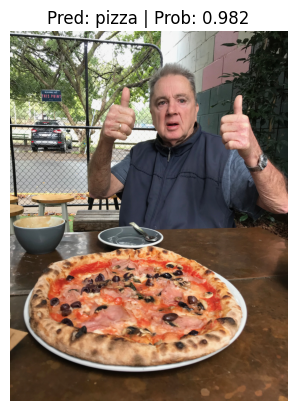

In [56]:
#predict custom image
# Download custom image
import requests

# Setup custom image path
custom_image_path = Path("data/04-pizza-dad.jpeg")

# Download the image if it doesn't already exist
if not custom_image_path.is_file():
    with open(custom_image_path, "wb") as f:
        # When downloading from GitHub, need to use the "raw" file link
        request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
        print(f"Downloading {custom_image_path}...")
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")

# Predict on custom image
pred_and_plot_image(model=model,
                    image_path=custom_image_path,
                    class_names=class_names)